In [ ]:
# Clone the repository and set up the environment
!git clone https://github.com/GaParmar/img2img-turbo.git
!pip install -r img2img-turbo/requirements.txt
!pip uninstall -y huggingface_hub diffusers transformers sentence-transformers peft accelerate
!pip install huggingface_hub==0.23.0
!pip install diffusers==0.25.1
!pip install transformers==4.41.0
!pip install sentence-transformers==3.2.1
!pip install peft==0.13.2
!pip install accelerate==0.21.0


fatal: destination path 'img2img-turbo' already exists and is not an empty directory.
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-5lul0ujx/clip_e58dc406d49c46dd97fe3c40c0629cd4
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-5lul0ujx/clip_e58dc406d49c46dd97fe3c40c0629cd4
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Using cached transformers-4.35.2-py3-none-any.whl.metadata (123 kB)
  Using cached diffusers-0.25.1-py3-none-any.whl.metadata (19 kB)
  Using cached tokenizers-0.15.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.7 kB)
Using cached transformers-4.35.2-py3-none-any.whl (7.9 MB)
Using cached diffusers-0.25.1-py3-none-any.whl (1.8 MB)
Using cached tokenizers-0.15.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.8/

In [ ]:
!pip install gensim

In [ ]:
!pip install pot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.6/865.6 kB 18.7 MB/s eta 0:00:00


In [ ]:
# Import necessary libraries
from transformers import AutoImageProcessor, AutoModel
import torch
from scipy.stats import wasserstein_distance
from PIL import Image
import subprocess
import os
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer
import time

from IPython.display import display, Image as Image2
import sys
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors

from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Set up DINOv2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

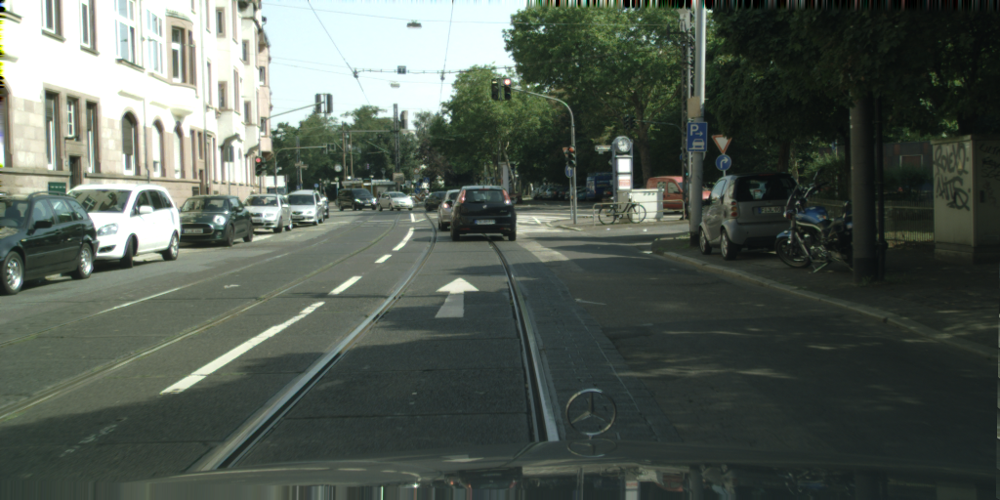

In [ ]:
# Load the initial image
url = "/content/1.png"
init_image = Image.open(url)
display(init_image)

Starting edge-to-image generation...
Downloaded successfully to checkpoints/edge_to_image_loras.pkl



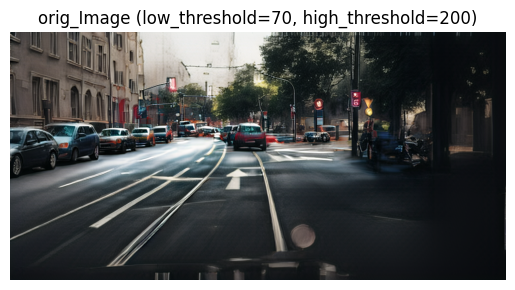

Orig image saved as: /content/output_image.png/orig_image.png
Edge-to-image generation complete.


In [ ]:


# Input parameters
input_image_path = "/content/1.png"  # Path to the input image
prompt = "transform it to become blur"  # Prompt to generate the image
output_dir = "/content/output_image.png"  # Directory to store outputs
model_name = "edge_to_image"  # Model name for inference
low_threshold = 70  # Canny edge detection low threshold
high_threshold = 200  # Canny edge detection high threshold

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Verify input image exists
if not os.path.exists(input_image_path):
    raise FileNotFoundError(f"Input image not found at {input_image_path}")

# Load the input image
input_image = Image.open(input_image_path)

# Run the generation process
try:
    print("Starting edge-to-image generation...")
    command = [
        "python", "img2img-turbo/src/inference_paired.py",  # Path to your script
        "--model_name", model_name,
        "--input_image", input_image_path,
        "--prompt", prompt,
        "--output_dir", output_dir,
        "--low_threshold", str(low_threshold),
        "--high_threshold", str(high_threshold),
    ]

    # Execute the command
    result = subprocess.run(command, check=True, capture_output=True, text=True)
    print(result.stdout)  # Print the output of the command if successful

    # Find the latest generated file in the output directory
    latest_file = max(
        [os.path.join(output_dir, f) for f in os.listdir(output_dir) if os.path.isfile(os.path.join(output_dir, f))],
        key=os.path.getctime
    )
    orig_image = Image.open(latest_file)  # Open the latest generated image

    # Display the generated image
    plt.imshow(orig_image)
    plt.axis("off")
    plt.title(f"orig_Image (low_threshold={low_threshold}, high_threshold={high_threshold})")
    plt.show()

    # Save the generated image as 'orig_image.png'
    save_path = os.path.join(output_dir, "orig_image.png")
    orig_image.save(save_path)
    print(f"Orig image saved as: {save_path}")

    print("Edge-to-image generation complete.")
except subprocess.CalledProcessError as e:
    print(f"Error during image generation:\n{e.stderr}")
except FileNotFoundError as e:
    print(f"File error: {e}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/My Drive/GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(file_path, binary=True)


Perturbation: (0, 0, 0, 1, 1), Perturbed Text: become blur
Perturbation: (0, 1, 1, 1, 0), Perturbed Text: become to it
Perturbation: (1, 0, 1, 0, 1), Perturbed Text: blur transform to
Perturbation: (1, 0, 1, 1, 0), Perturbed Text: become transform to
Perturbation: (1, 1, 1, 0, 0), Perturbed Text: to transform it
Perturbation: (1, 0, 0, 0, 0), Perturbed Text: blur transform it
Perturbation: (1, 1, 1, 1, 1), Perturbed Text: transform to it blur become
Perturbation: (0, 0, 1, 0, 0), Perturbed Text: become it to
Perturbation: (1, 0, 1, 0, 0), Perturbed Text: transform to
Perturbation: (0, 1, 1, 1, 1), Perturbed Text: become to blur it
Perturbation: (0, 0, 1, 1, 0), Perturbed Text: become to
Perturbation: (1, 0, 0, 0, 1), Perturbed Text: blur transform
Perturbation: (0, 0, 1, 1, 1), Perturbed Text: become blur to
Perturbation: (0, 0, 0, 0, 1), Perturbed Text: blur to
Perturbation: (0, 1, 0, 0, 1), Perturbed Text: blur it
Perturbation: (1, 1, 0, 0, 1), Perturbed Text: blur transform it
Pertu

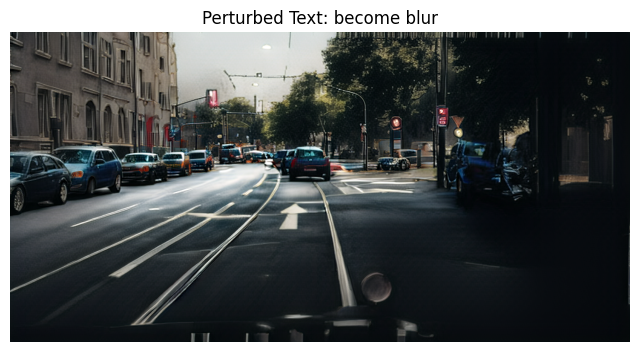


Perturbation 2:
Perturbed Text: become to it
Wasserstein distance (generated vs orig): 0.023888791307854228


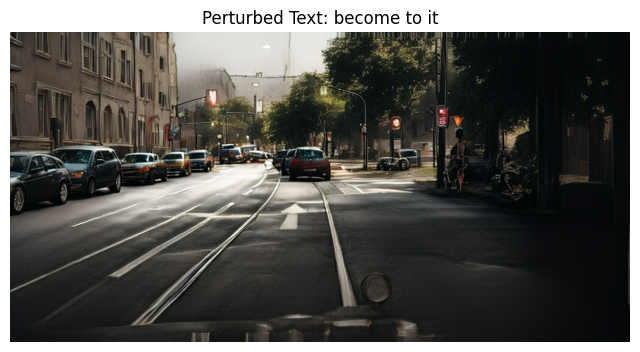


Perturbation 3:
Perturbed Text: blur transform to
Wasserstein distance (generated vs orig): 0.022796983488433394


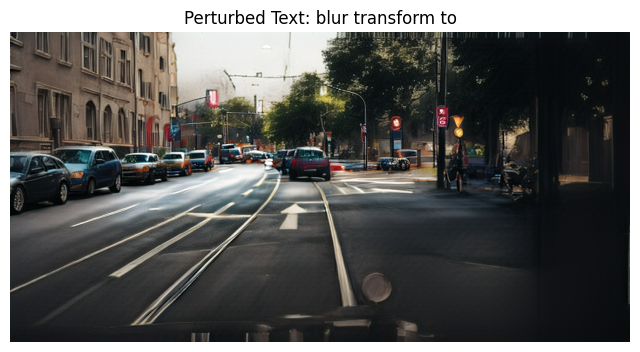


Perturbation 4:
Perturbed Text: become transform to
Wasserstein distance (generated vs orig): 0.028016886951566764


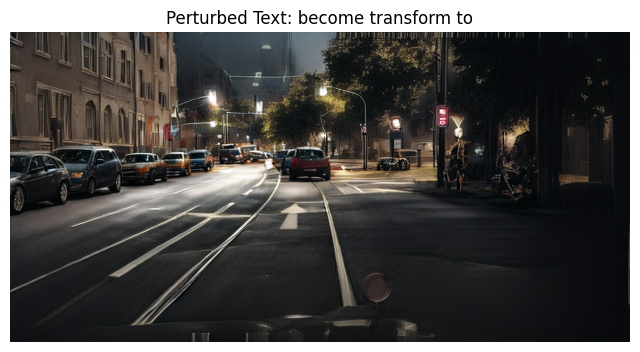


Perturbation 5:
Perturbed Text: to transform it
Wasserstein distance (generated vs orig): 0.023443556647028616


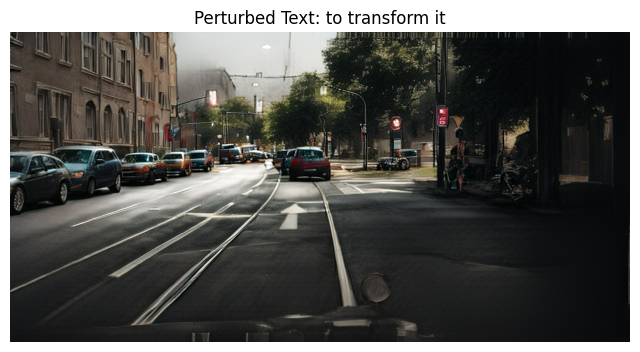


Perturbation 6:
Perturbed Text: blur transform
Wasserstein distance (generated vs orig): 0.020402933627944222


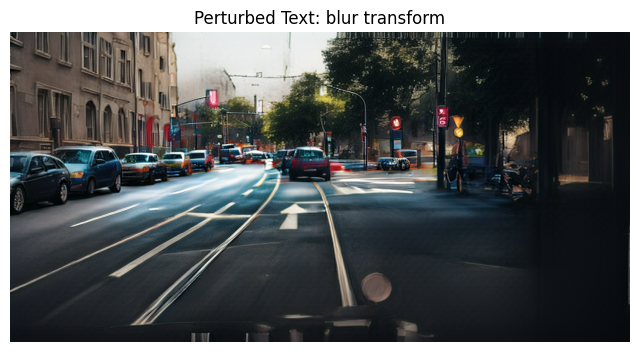


Perturbation 7:
Perturbed Text: transform to it blur become
Wasserstein distance (generated vs orig): 0.017078848337253774


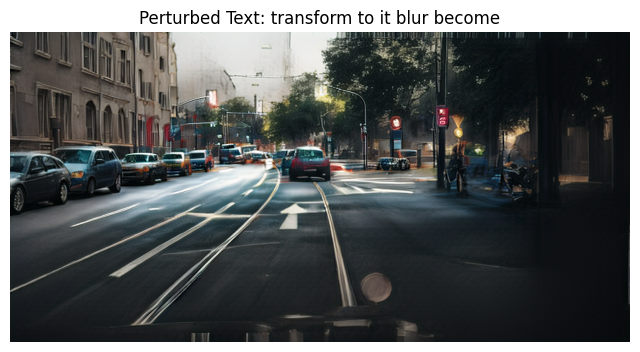


Perturbation 8:
Perturbed Text: it to
Wasserstein distance (generated vs orig): 0.021999140134918552


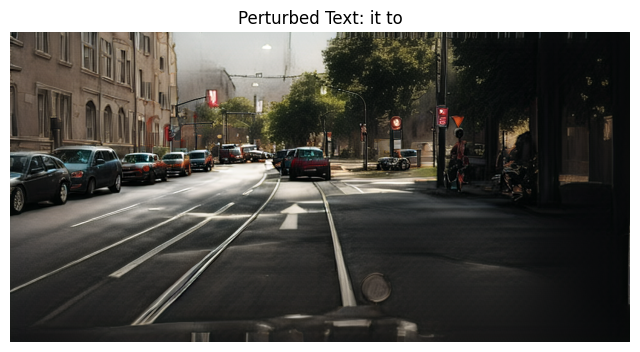


Perturbation 9:
Perturbed Text: transform to
Wasserstein distance (generated vs orig): 0.023497412886778545


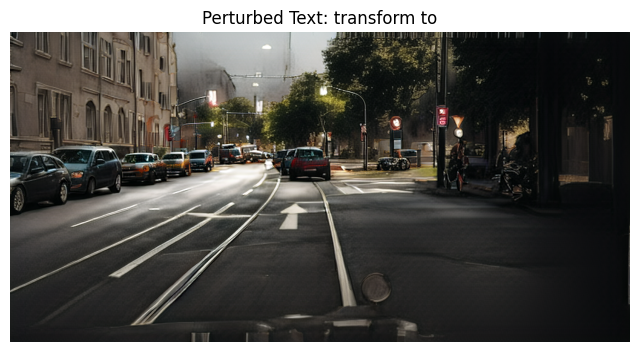


Perturbation 10:
Perturbed Text: become to blur it
Wasserstein distance (generated vs orig): 0.01659999614004449


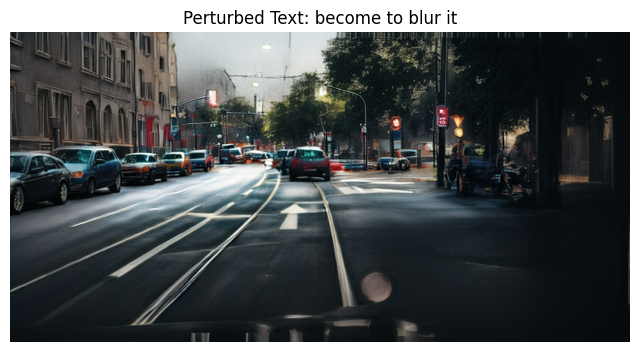


Perturbation 11:
Perturbed Text: become to
Wasserstein distance (generated vs orig): 0.026723850910760405


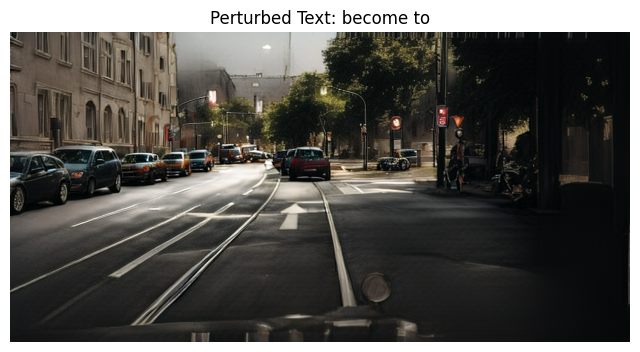


Perturbation 12:
Perturbed Text: blur transform
Wasserstein distance (generated vs orig): 0.020230791937137817


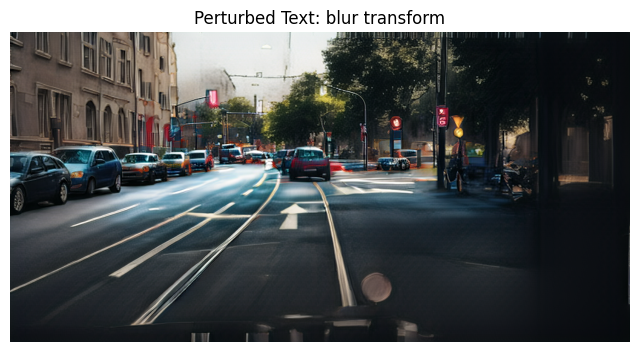


Perturbation 13:
Perturbed Text: become blur to
Wasserstein distance (generated vs orig): 0.019156399773540517


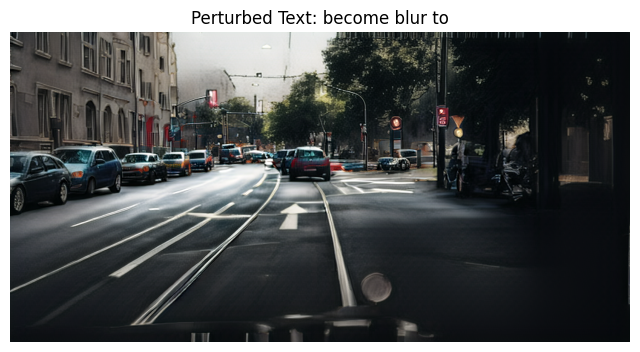


Perturbation 14:
Perturbed Text: blur to it
Wasserstein distance (generated vs orig): 0.030950657181544265


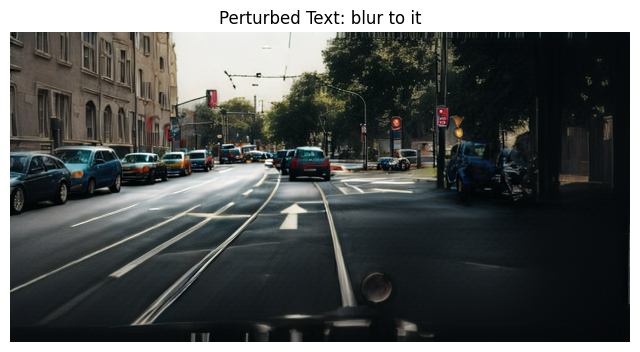


Perturbation 15:
Perturbed Text: blur it
Wasserstein distance (generated vs orig): 0.02210302794238334


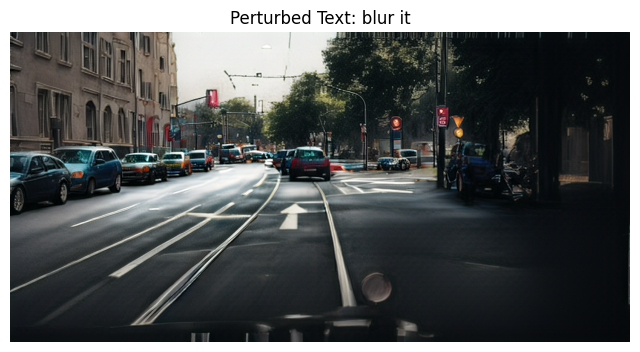


Perturbation 16:
Perturbed Text: blur transform it
Wasserstein distance (generated vs orig): 0.024148051564300957


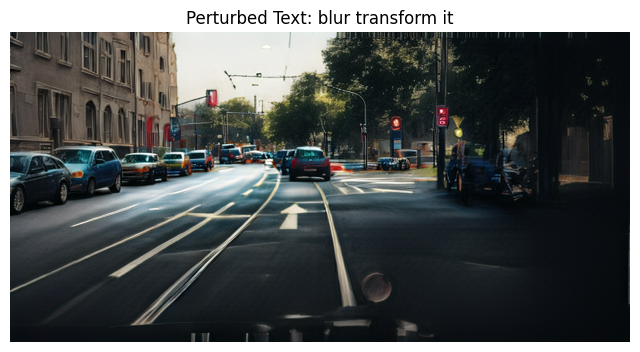


Perturbation 17:
Perturbed Text: become blur transform
Wasserstein distance (generated vs orig): 0.016827483132146877


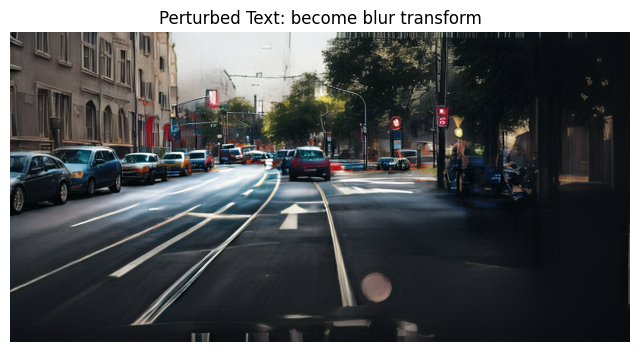


Perturbation 18:
Perturbed Text: become to
Wasserstein distance (generated vs orig): 0.026161179193726018


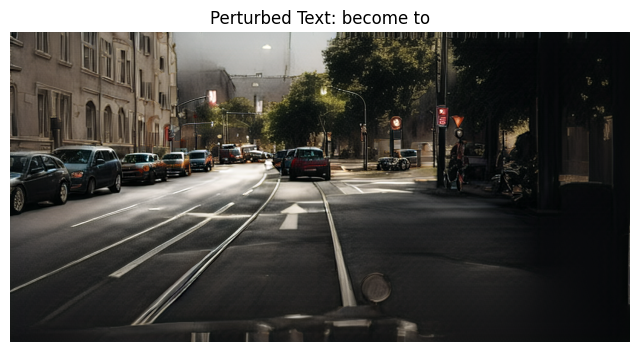


Perturbation 19:
Perturbed Text: become to transform it
Wasserstein distance (generated vs orig): 0.024054966923207154


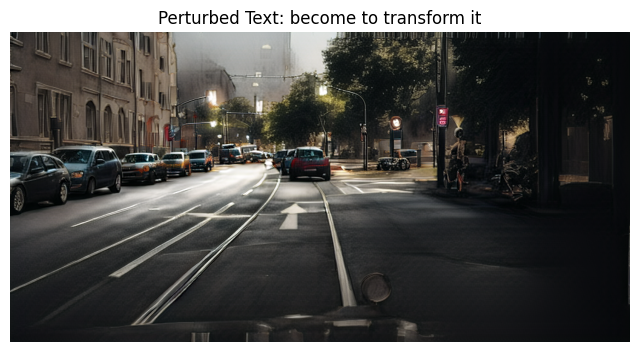


Perturbation 20:
Perturbed Text: to it
Wasserstein distance (generated vs orig): 0.022682559730204305


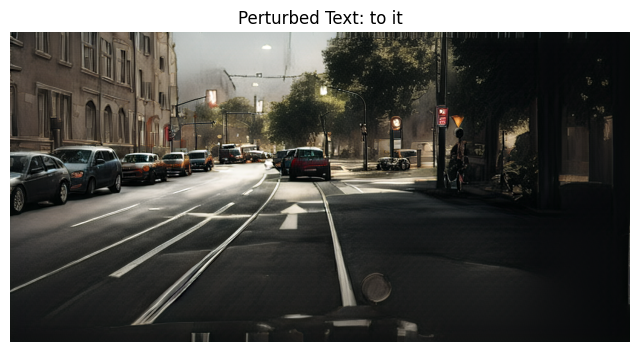


Perturbation 21:
Perturbed Text: blur to it
Wasserstein distance (generated vs orig): 0.0305537007776593


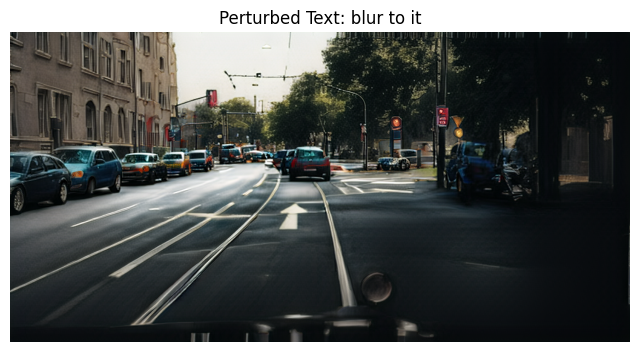


Perturbation 22:
Perturbed Text: become transform
Wasserstein distance (generated vs orig): 0.031409689814912184


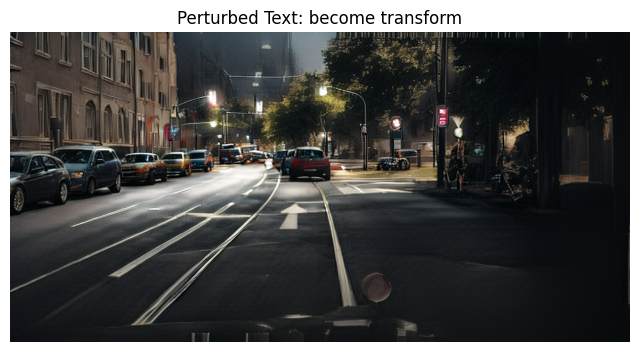


Perturbation 23:
Perturbed Text: become transform it
Wasserstein distance (generated vs orig): 0.027598946916289918


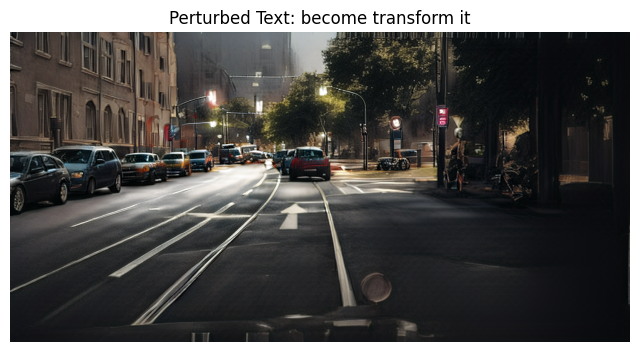


Perturbation 24:
Perturbed Text: become blur it
Wasserstein distance (generated vs orig): 0.022187645433405127


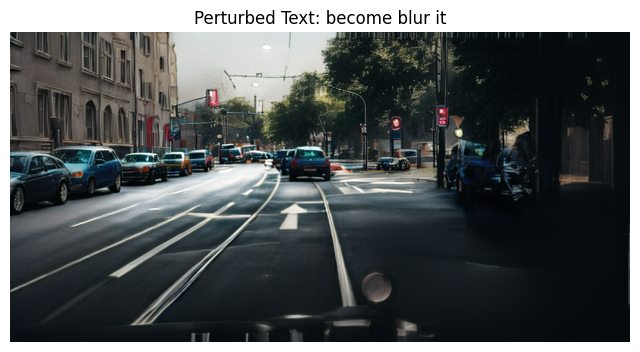


Perturbation 25:
Perturbed Text: become blur transform to
Wasserstein distance (generated vs orig): 0.017849102132762105


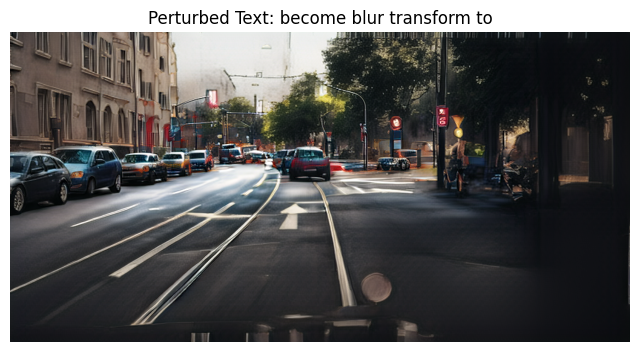


Perturbation 26:
Perturbed Text: to it
Wasserstein distance (generated vs orig): 0.022686416513048806


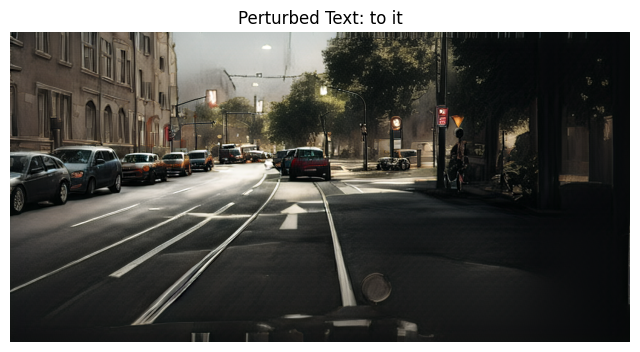


Perturbation 27:
Perturbed Text: blur to
Wasserstein distance (generated vs orig): 0.028115226241273654


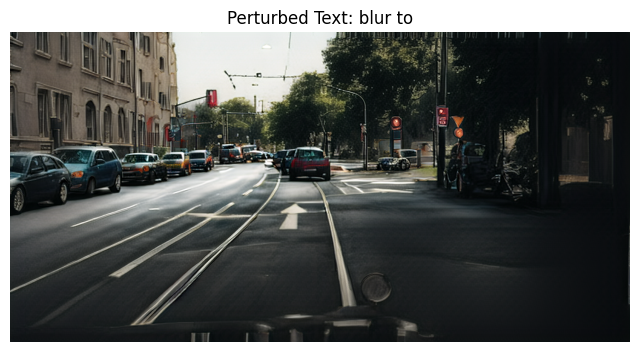


Perturbation 28:
Perturbed Text: blur to transform it
Wasserstein distance (generated vs orig): 0.018607975546425813


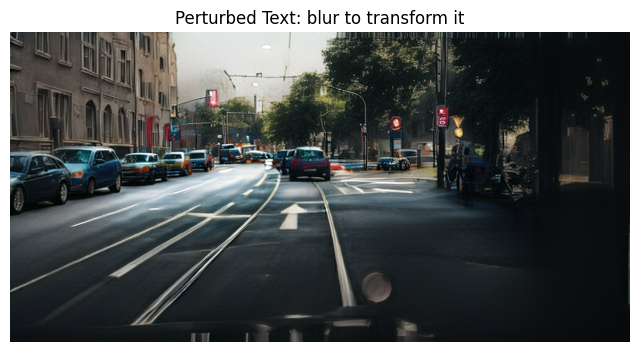


Perturbation 29:
Perturbed Text: transform it
Wasserstein distance (generated vs orig): 0.031682573035965285


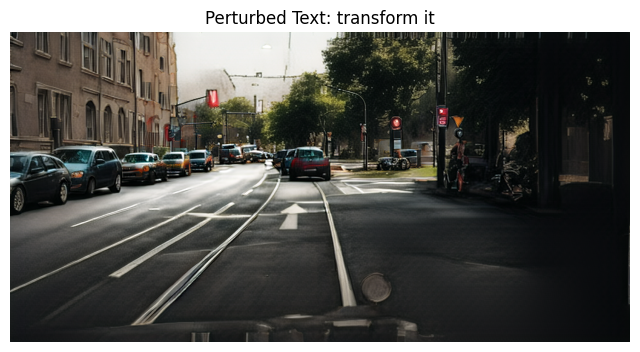


Perturbation 30:
Perturbed Text: become it
Wasserstein distance (generated vs orig): 0.021332100091664544


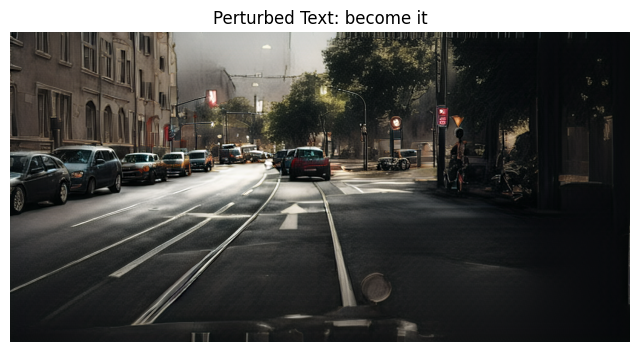

All generated embeddings and Wasserstein distances saved.
WMD Scores:

Original vs Perturbed 1: 0.3954
Original vs Perturbed 2: 0.3717
Original vs Perturbed 3: 0.2339
Original vs Perturbed 4: 0.1862
Original vs Perturbed 5: 0.3295
Original vs Perturbed 6: 0.2504
Original vs Perturbed 7: 0.0000
Original vs Perturbed 8: 0.3717
Original vs Perturbed 9: 0.3635
Original vs Perturbed 10: 0.2218
Original vs Perturbed 11: 0.4382
Original vs Perturbed 12: 0.3098
Original vs Perturbed 13: 0.2917
Original vs Perturbed 14: 0.4093
Original vs Perturbed 15: 0.4965
Original vs Perturbed 16: 0.2504
Original vs Perturbed 17: 0.1550
Original vs Perturbed 18: 0.3029
Original vs Perturbed 19: 0.1497
Original vs Perturbed 20: 0.6973
Original vs Perturbed 21: 0.3931
Original vs Perturbed 22: 0.2246
Original vs Perturbed 23: 0.1535
Original vs Perturbed 24: 0.3029
Original vs Perturbed 25: 0.0850
Original vs Perturbed 26: 0.3717
Original vs Perturbed 27: 0.4093
Original vs Perturbed 28: 0.2179
Original vs Pe

In [ ]:

# Record the start time
start_time = time.time()
# Setting up seeds for reproducibility
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
rng = np.random.default_rng(seed)

# Define the embedding extraction function
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

def perturb_text(text_list, perturbation, rng):
    # Select words based on the perturbation flag (1 means include), ensuring no duplicate words within a single sentence
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag == 1 and item.strip() != ""]

    # If no words were selected, force-select at least two words
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2
        available_words = [item for item in text_list if item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = list(set(perturbed_list_initial + list(additional_words)))  # Ensure unique words
    else:
        perturbed_list = list(set(perturbed_list_initial))  # Remove duplicates within the sentence

    return perturbed_list

# Function to generate images using inference_paired.py
def generate_image(input_image_path, prompt, output_dir, model_name, low_threshold, high_threshold, seed):
    try:
        # Running the image generation script using subprocess
        result = subprocess.run(
            [
                "python", "img2img-turbo/src/inference_paired.py",
                "--model_name", model_name,
                "--input_image", input_image_path,
                "--prompt", prompt,
                "--output_dir", output_dir,
                "--low_threshold", str(low_threshold),
                "--high_threshold", str(high_threshold),
                "--seed", str(seed)
            ],
            check=True,
            capture_output=True,
            text=True
        )

        print(result.stdout)  # Capture and print stdout if successful

        # Find the generated image in the output directory
        files = [os.path.join(output_dir, f) for f in os.listdir(output_dir)]
        files = [f for f in files if os.path.isfile(f)]
        if not files:
            raise FileNotFoundError(f"No files found in directory: {output_dir}")
        return max(files, key=os.path.getctime)

    except subprocess.CalledProcessError as e:
        print(f"Error occurred while running the command: {e}")
        print(f"stderr: {e.stderr}")  # Print stderr to help diagnose the error
        raise e  # Re-raise the error after printing for further handling

# Assuming `prompt` is predefined
prompt = "transform it to become blur"
input_image_path = "/content/1.png"
output_dir = "/content/orig_image.png"
model_name = "edge_to_image"
low_threshold = 70  # Control Canny edge sensitivity (lower = more edges)
high_threshold = 200  # Control Canny edge sensitivity (higher = fewer edges)

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Verify input image exists
if not os.path.exists(input_image_path):
    raise FileNotFoundError(f"Input image not found at {input_image_path}")

# Load the input image for embedding extraction
input_image = Image.open(input_image_path)

# Assuming `extract_image_embedding` and model loading is correctly handled
# Get the original image embedding
orig_embedding = extract_image_embedding(orig_image, processor, model)  # Replace with actual processor/model

# Create perturbations and generate images
words = prompt.split()
text_list = words.copy()
num_perturb = 30  # Number of perturbations to generate
num_words = len(words)

Responses = []
Perturbations = []
unique_perturbations = set()
rng = np.random.default_rng(seed)

# Try up to a certain number of attempts to generate unique perturbations
attempts = 0
max_attempts = num_perturb * 10  # Allow 10 attempts per unique perturbation

# Loop for unique perturbations only
while len(unique_perturbations) < num_perturb and attempts < max_attempts:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))
    if perturbation not in unique_perturbations and sum(perturbation) > 0:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)
        Perturbations.append(perturbation)
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")  # Print unique perturbation text
    attempts += 1

# If more perturbations are needed, allow repeats by sampling from unique_perturbations
while len(Responses) < num_perturb:
    perturbation = rng.choice(list(unique_perturbations))
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    Responses.append(corpus)
    Perturbations.append(perturbation)
    print(f"Perturbation (reused): {perturbation}, Perturbed Text: {corpus}")

# Initialize Wasserstein distances
WD_dists_generated_vs_orig = []

# Compute Wasserstein distances and display results
for i, perturbation in enumerate(Perturbations):
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    WD_dist_generated = float('inf')

    # Generate image and extract embeddings
    generated_image_path = generate_image(input_image_path, corpus, output_dir, model_name, low_threshold, high_threshold, seed)
    generated_image = Image.open(generated_image_path)

    # Extract the embedding of the generated image
    generated_embedding = extract_image_embedding(generated_image, processor, model)  # Replace with actual processor/model

    # Ensure both embeddings are numpy arrays and not empty
    if generated_embedding is None or orig_embedding is None:
        raise ValueError("One or both embeddings are None. Ensure the embedding extraction function is working correctly.")

    generated_embedding = np.array(generated_embedding)
    orig_embedding = np.array(orig_embedding)

    if generated_embedding.size == 0 or orig_embedding.size == 0:
        raise ValueError("Embeddings are empty, cannot compute Wasserstein distance.")

    # Now calculate the Wasserstein distance
    WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)
    WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

    # Display results
    print(f"Perturbation {i + 1}:")
    print(f'Perturbed Text: {corpus}')
    print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

    # Display the generated image
    plt.figure(figsize=(8, 8))
    plt.imshow(generated_image)
    plt.title(f"Perturbed Text: {corpus}", fontsize=12)
    plt.axis('off')
    plt.show()

# Save all generated embeddings and Wasserstein distances for analysis
np.save("WD_dists_generated_vs_orig.npy", np.array(WD_dists_generated_vs_orig))
print("All generated embeddings and Wasserstein distances saved.")
wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores
Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 1: Compute the inverse of the distances (add a small value to avoid division by zero)
epsilon = 1e-8  # Small value to prevent division by zero
inverse_distances = 1 / (WD_dists_generated_vs_orig + epsilon)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_inv = np.min(inverse_distances)
max_inv = np.max(inverse_distances)

Similarities = (inverse_distances - min_inv) / (max_inv - min_inv)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)
distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y= Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)
# Record the end time and calculate total execution time
end_time = time.time()
print(f"Total execution time: {end_time - start_time:.2f} seconds")


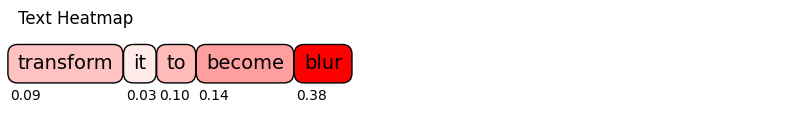

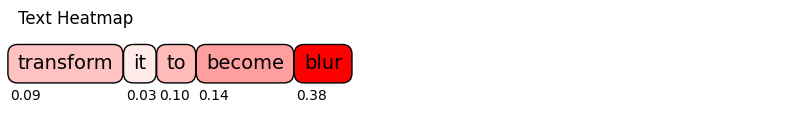

In [ ]:
# Function to plot text heatmap
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y -= 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Example usage
# Define the prompt and coefficients
words = prompt.split(' ')

# Save path for Colab (use appropriate path or '/content/...')
save_path = '/content/text_heatmap.png'

# Call the function with the save path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)

# To display the saved image in Colab
from IPython.display import Image
Image(filename=save_path)